In [253]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# defining the environment
class McCallModelEnv:
    def __init__(self, wage_min=0, wage_max=100, value_match=200, age_start=20, age_retire=60,
                  unemployment_penalty=5.0, gamma=1., p_exit=0.01, age_based_mode=False, use_random_reservation_wage=False, worker_only_mode=False):
        self.wage_min = wage_min
        self.wage_max = wage_max
        self.value_match = value_match # total val of a match (firm + worker split)

        # age based
        self.age_start = age_start
        self.age_retire = age_retire
        self.unemployment_penalty = unemployment_penalty

        # age based mode
        self.age_based_mode = age_based_mode

        # random probability of exit
        self.p_exit = p_exit
        self.use_random_reservation_wage = use_random_reservation_wage

        # worker only mode
        self.worker_only_mode = worker_only_mode

        self.gamma = gamma
        self.reset()

    def reset(self):
        self.done = False
        if self.worker_only_mode:
            # Worker-only logic: always set a reservation wage
            self.reservation_wage = 50
            return self.reservation_wage
        else:
            if self.use_random_reservation_wage:
                self.reservation_wage = np.random.uniform(
                    self.wage_min + 0.3 * (self.wage_max - self.wage_min),
                    self.wage_min + 0.7 * (self.wage_max - self.wage_min)
                )
            self.current_age = np.random.randint(self.age_start, self.age_retire)
            return self.current_age
    
    def step(self, wage_offer):
        if self.worker_only_mode:
            if wage_offer >= self.reservation_wage:
                action = 1
                self.done = True
                reward = wage_offer
                print("Worker accepted offer of ", wage_offer)
            else:
                action = 0
                self.done = False
                reward = 0
                print("Worker rejected offer of ", wage_offer)
            return reward, self.done, action # finish step here
        
        # if not worker only mode
        else:
            # Default decision logic
            if self.use_random_reservation_wage:
                # Constant random reservation wage
                reservation_wage = np.random.uniform(
                    self.wage_min + 0.3 * (self.wage_max - self.wage_min),
                    self.wage_min + 0.7 * (self.wage_max - self.wage_min)
                )
            else:
                # Age-based reservation wage
                reservation_wage = np.clip(
                    self.wage_min + (self.wage_max - self.wage_min) * 
                    (self.age_retire - self.current_age) / (self.age_retire - self.age_start),
                    self.wage_min, self.wage_max
                )
        
        if wage_offer >= reservation_wage:
            action = 1 # accept
            firm_profit = self.value_match - wage_offer
            worker_reward = wage_offer
            self.done = True
        else:
            action = 0 # reject
            firm_profit = -self.unemployment_penalty
            worker_reward = -self.unemployment_penalty
            self.done = False

        if self.use_random_reservation_wage and np.random.rand() < self.p_exit:
            self.done = True

        if not self.use_random_reservation_wage:
            self.current_age += 1
            if self.current_age >= self.age_retire:
                self.done = True

        return firm_profit, worker_reward, self.done, action

In [254]:
class FirmAgent:
    def __init__(self, n_states, n_wage_levels=10, alpha=0.1, gamma=1.0, epsilon=0.5):
        self.q_table = np.zeros((n_states, n_wage_levels))
        self.alpha = alpha  # Learning rate
        self.gamma = gamma  # Discount factor
        self.epsilon = epsilon  # Exploration rate
        self.n_wage_levels = n_wage_levels
    
    def discretize_action(self, wage, wage_min, wage_max):
        return min(int((wage - wage_min) / (wage_max - wage_min) * self.n_wage_levels), self.n_wage_levels - 1)

    def choose_action(self, state, episode, n_episodes):
        epsilon = max(0.01, self.epsilon * (1 - episode / n_episodes)**0.5)
        if np.random.rand() < epsilon:
            return np.random.choice(self.n_wage_levels)
        else:
            return np.argmax(self.q_table[state])

    def update_q_table(self, state, action, reward, next_state, done):
        if done:
            td_target = reward
        else:
            best_next_action = np.argmax(self.q_table[next_state])
            td_target = reward + self.gamma * self.q_table[next_state, best_next_action]
        td_error = td_target - self.q_table[state, action]
        self.q_table[state, action] += self.alpha * td_error

class WorkerAgent:
    def __init__(self, n_wage_states = 150, n_age_states = 40, n_actions=2, alpha=0.1, gamma=1.0, epsilon=0.5): # epsilon btwn 0 and 1
        self.q_table = np.zeros((n_wage_states, n_age_states, n_actions))
        self.alpha = alpha  # learning rate
        self.gamma = gamma  # discount factor
        self.epsilon = epsilon  # exploration rate for epsilon-greedy strategy
        self.n_actions = n_actions
        self.n_wage_states = n_wage_states
        self.n_age_states = n_age_states

    def discretize_state(self, wage, age, max_wage=100, min_age=20, max_age=60):
        wage_state = min(int(wage / max_wage * self.n_wage_states), self.n_wage_states - 1)
        age_state = min(int((age - min_age) / (max_age - min_age) * self.n_age_states), self.n_age_states - 1)
        return wage_state, age_state

    def choose_action(self, state, episode, n_episodes):
        wage_state, age_state = state
        epsilon = max(0.01, self.epsilon * (1 - episode / n_episodes))  # decaying epsilon
        if np.random.rand() < epsilon:  # explore
            return np.random.choice(self.n_actions)
        else:  # exploit
            return np.argmax(self.q_table[wage_state, age_state, :])

    def update_q_table(self, state, action, reward, next_state, done):
        wage_state, age_state = state
        if done:
            td_target = reward  # no future reward since episode has ended
        else:
            next_wage_state, next_age_state = next_state
            best_next_action = np.argmax(self.q_table[next_wage_state, next_age_state, :])
            td_target = reward + self.gamma * self.q_table[next_wage_state, next_age_state, best_next_action]
        td_error = td_target - self.q_table[wage_state, age_state, action]
        self.q_table[wage_state, age_state, action] += self.alpha * td_error

In [255]:
def simulate(env, n_episodes, firm):
    if env.worker_only_mode:
        acceptance_counts = 0
        wage_offers = []
        reservation_wages = []

        for episode in range(n_episodes):
            env.reset()  # Reset environment (new reservation wage)
            
            # Generate and shuffle wage offers for this episode
            episode_wage_offers = np.linspace(env.wage_min, env.wage_max, 20)
            np.random.shuffle(episode_wage_offers)  # Shuffle for randomness
            
            for wage_offer in episode_wage_offers:
                _, done, action = env.step(wage_offer)
                wage_offers.append(wage_offer)  # Track all wage offers
                reservation_wages.append(env.reservation_wage)  # Track reservation wages
                if done:  # Stop after the worker accepts or exits
                    break

        # Calculate acceptance rate
        acceptance_rate = acceptance_counts / n_episodes
        return wage_offers, acceptance_rate
    else:
        # Track firm decisions and worker responses
        firm_offers = np.zeros((firm.n_wage_levels, env.age_retire - env.age_start)) if not env.use_random_reservation_wage else np.zeros((firm.n_wage_levels))
        worker_accepts = np.zeros_like(firm_offers)
        firm_profits = []

        for episode in range(n_episodes):
            worker_age = env.reset()
            done = False
            total_profit = 0

            while not done:

                # firm state logic
                if env.use_random_reservation_wage:
                    firm_state = 0 # one state for all workers
                else:
                    # firm's state is based on normalized worker age
                    firm_state = int((worker_age - env.age_start) / (env.age_retire - env.age_start) * firm.q_table.shape[0])
                    firm_state = min(firm_state, firm.q_table.shape[0] - 1)  # Prevent out-of-bounds error

                # Firm chooses a wage to offer
                firm_action_index = firm.choose_action(firm_state, episode, n_episodes)
                firm_action = env.wage_min + firm_action_index * (env.wage_max - env.wage_min) / firm.n_wage_levels

                # Environment step
                firm_reward, worker_reward, done, action = env.step(firm_action)
                total_profit += firm_reward

                if env.use_random_reservation_wage:
                    firm_offers[firm_action_index] += 1
                    # worker accepted
                    if action == 1: 
                        worker_accepts[firm_action_index] += 1
                else:
                    age_index = worker_age - env.age_start
                    firm_offers[firm_action_index, age_index] += 1
                    if action == 1:  # Worker accepted
                        worker_accepts[firm_action_index, age_index] += 1

                # Update Q-table
                firm.update_q_table(firm_state, firm_action_index, firm_reward, firm_state, done)

                # If worker accepts, end the episode
                if done:
                    break
            
            firm_profits.append(total_profit)

        acceptance_rates = np.divide(worker_accepts, firm_offers, out=np.zeros_like(worker_accepts, dtype=float), where=firm_offers != 0)

        return firm_offers, worker_accepts, acceptance_rates, firm_profits

In [256]:
# environments
worker_only_env = McCallModelEnv(worker_only_mode=True)
age_based_env = McCallModelEnv(use_random_reservation_wage=False)
random_env = McCallModelEnv(use_random_reservation_wage=True, p_exit=0.02)

firm = FirmAgent(n_states=40, n_wage_levels=20)

n_episodes = 150000
wage_offers, worker_only_acceptance_rates = simulate(worker_only_env, n_episodes, firm = None)
age_based_results = simulate(age_based_env, n_episodes, firm) 
random_results = simulate(random_env, n_episodes, firm)

Worker rejected offer of  21.05263157894737
Worker accepted offer of  78.94736842105263
Worker accepted offer of  68.42105263157896
Worker rejected offer of  0.0
Worker accepted offer of  78.94736842105263
Worker accepted offer of  63.15789473684211
Worker rejected offer of  15.789473684210527
Worker accepted offer of  52.631578947368425
Worker accepted offer of  84.21052631578948
Worker accepted offer of  100.0
Worker rejected offer of  15.789473684210527
Worker rejected offer of  10.526315789473685
Worker accepted offer of  73.6842105263158
Worker rejected offer of  26.315789473684212
Worker rejected offer of  47.36842105263158
Worker accepted offer of  68.42105263157896
Worker accepted offer of  100.0
Worker accepted offer of  73.6842105263158
Worker rejected offer of  21.05263157894737
Worker accepted offer of  73.6842105263158
Worker rejected offer of  42.10526315789474
Worker rejected offer of  21.05263157894737
Worker accepted offer of  73.6842105263158
Worker accepted offer of 

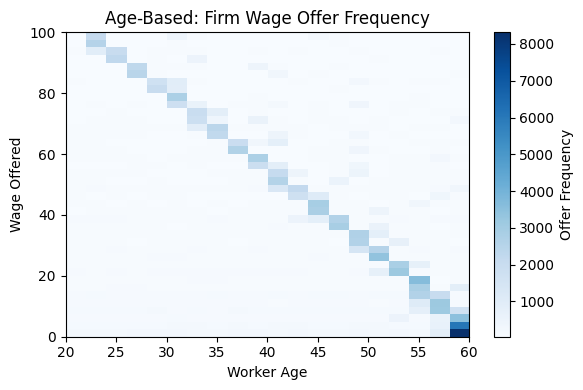

In [257]:
fig, axes = plt.subplots(figsize=(6, 4))

# Age-Based Model: Firm's Wage Offer Heatmap
im1 = axes.imshow(age_based_results[0].T, origin='lower', aspect='auto', cmap='Blues',
                      extent=[age_based_env.age_start, age_based_env.age_retire, age_based_env.wage_min, age_based_env.wage_max])
axes.set_title('Age-Based: Firm Wage Offer Frequency')
axes.set_xlabel('Worker Age')
axes.set_ylabel('Wage Offered')
fig.colorbar(im1, ax=axes, label='Offer Frequency')

plt.tight_layout()
plt.show()

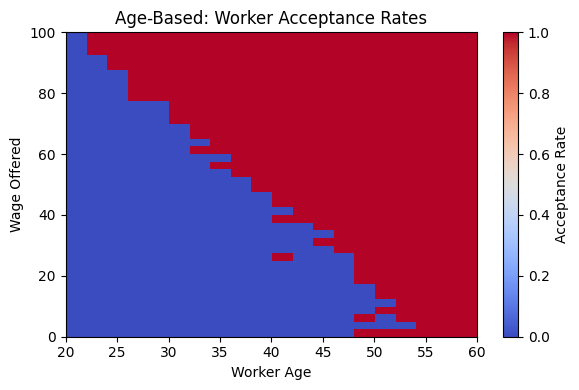

In [258]:
fig, axes = plt.subplots(figsize=(6, 4))

# Age-Based Model: Worker Acceptance Heatmap
im2 = axes.imshow(age_based_results[1].T, origin='lower', aspect='auto', cmap='coolwarm',
                      extent=[age_based_env.age_start, age_based_env.age_retire, age_based_env.wage_min, age_based_env.wage_max], vmin=0, vmax=1)
axes.set_title('Age-Based: Worker Acceptance Rates')
axes.set_xlabel('Worker Age')
axes.set_ylabel('Wage Offered')
fig.colorbar(im2, ax=axes, label='Acceptance Rate')

plt.tight_layout()
plt.show()

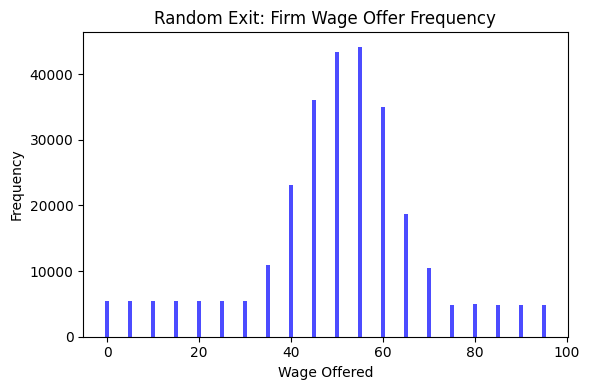

In [259]:
fig, axes = plt.subplots(figsize=(6, 4))

# Random Model: Firm's Wage Offer Graph
if random_env.use_random_reservation_wage:
    im3 = axes.bar(np.arange(random_env.wage_min, random_env.wage_max, (random_env.wage_max - random_env.wage_min) / firm.n_wage_levels),
                         random_results[0], color='blue', alpha=0.7)
    axes.set_title('Random Exit: Firm Wage Offer Frequency')
    axes.set_xlabel('Wage Offered')
    axes.set_ylabel('Frequency')
else:
    im3 = axes.imshow(random_results[0].T, origin='lower', aspect='auto', cmap='Blues',
                          extent=[random_env.age_start, random_env.age_retire, random_env.wage_min, random_env.wage_max])
    fig.colorbar(im3, ax=axes, label='Offer Frequency')

plt.tight_layout()
plt.show()

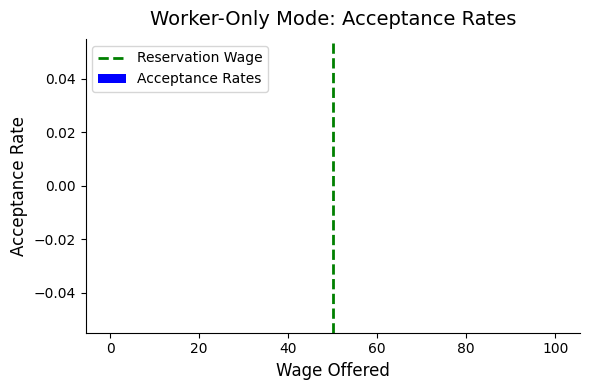

In [260]:
# fixed reservation wage
reservation_wage = 50

# Plot the bar graph
fig, ax = plt.subplots(figsize=(6, 4))

# Bar plot with thin bars
ax.bar(wage_offers, worker_only_acceptance_rates, width=1.0, color='blue', alpha=1.0, label='Acceptance Rates')

# Add the reservation wage line
ax.axvline(reservation_wage, color='green', linestyle='--', linewidth=2, label='Reservation Wage')

# Add labels and title
ax.set_title('Worker-Only Mode: Acceptance Rates', fontsize=14, pad=10)
ax.set_xlabel('Wage Offered', fontsize=12)
ax.set_ylabel('Acceptance Rate', fontsize=12)

# Simplify the layout
ax.grid(False)  # Remove gridlines
ax.spines['top'].set_visible(False)  # Hide the top spine
ax.spines['right'].set_visible(False)  # Hide the right spine
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_color('black')

# Add legend
ax.legend(loc='upper left', fontsize=10)

# Set ticks and tick labels
ax.tick_params(axis='both', which='major', labelsize=10)

# Adjust layout and show
plt.tight_layout()
plt.show()
